In [1]:
%matplotlib inline
import matplotlib.pyplot as plt
from scipy import signal
from scipy.io import wavfile
import numpy as np
from pylab import rcParams
import warnings
import wave
from iplot import iplot
from parse import parse_segments

#warnings.filterwarnings('ignore')
rcParams['figure.figsize'] = 13, 7

In [2]:
data_dir = '../soundAnalysis/data/data/22-03-16-agn-n/'
file_name = data_dir + '22-03-16-agn-12.wav'
file_segments = data_dir + '22-03-16-agn-12.6'

In [3]:
sample_rate, d_samples = wavfile.read(file_name)
print('Count={} rate={}'.format(len(d_samples), sample_rate))

Count=13234176 rate=44100


In [4]:
segments = parse_segments(file_segments)

In [5]:
iplot(d_samples[:1000000], segments=segments, skip=10)

## Обработка

In [6]:
def smooth(data, k=0.5):
    result = np.copy(data)
    s = data[0]
    for i in range(len(data)):
        s = k * data[i] + (1 - k) * s
        result[i] = s
    return result

In [39]:
# Сглаживание и уменьшение записи
SAMPLES_COUNT = 10**5
samples = d_samples[5713335:5729085]
shift = 100000
bad_samples = d_samples[5713335+shift:5729085+shift]
#samples = d_samples[:SAMPLES_COUNT].copy()
#samples = smooth(samples)
#samples = signal.savgol_filter(samples[:SAMPLES_COUNT], 7, 1)

In [40]:
print('min', samples.min())
print('max', samples.max())
print('mean', samples.mean())
print('std', samples.std())

min -1144
max 1630
mean 1.156
std 533.437361028


In [41]:
iplot(bad_samples)

/home/josdas/anaconda3/lib/python3.6/site-packages/matplotlib/mlab.py:1281: UserWarning:

Only one segment is calculated since parameter NFFT (=15750) >= signal length (=15750).



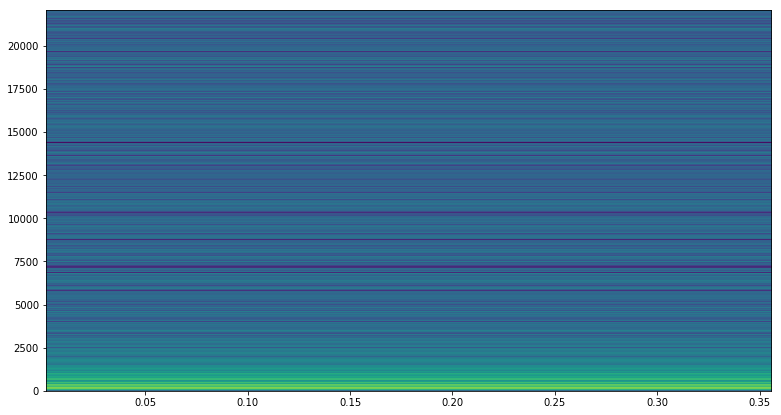

In [42]:
Pxx, freqs, bins, im = plt.specgram(samples, NFFT=len(samples), Fs=sample_rate)

/home/josdas/anaconda3/lib/python3.6/site-packages/numpy/core/numeric.py:531: ComplexWarning:

Casting complex values to real discards the imaginary part



(7850, 8300)

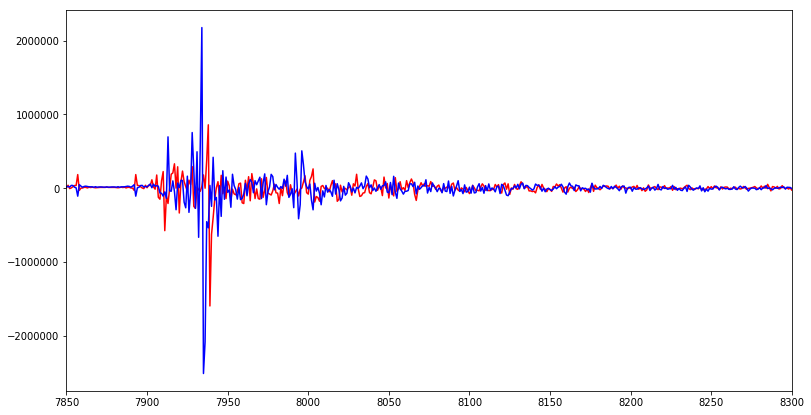

In [53]:
fourier= np.fft.fftshift(np.fft.fft(samples, n=len(samples)))
fourier_bad= np.fft.fftshift(np.fft.fft(bad_samples, n=len(bad_samples)))
plt.plot(fourier_bad+1, color='red')
plt.plot(fourier, color='blue')
plt.xlim(7850, 8300)

In [43]:
fourier= np.fft.fftshift(np.fft.fft(bad_samples, n=len(bad_samples)))
iplot([x.real for x in fourier])